In [13]:
PYTHON_PATHS = [".."]
import sys
for path in PYTHON_PATHS:
    if path not in sys.path:
        sys.path.append(path)
        
from imap.data.image_rendering_data_module import ImageRenderingDataModule
from imap.model.nerf import NERF
from imap.utils import UniversalFactory
from pytorch_lightning.utilities.parsing import AttributeDict
import pytorch_lightning as pl
from pytorch_lightning.loggers import TensorBoardLogger
import os
from pathlib import Path
import torch
from tqdm.notebook import tqdm

In [14]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from imap.utils.torch_math import *

# Load images

In [15]:
color_image_path = str(Path("../test_datasets/tum rgbd/rgbd_dataset_freiburg1_desk/rgb/1305031458.159638.png"))
depth_image_path = str(Path("../test_datasets/tum rgbd/rgbd_dataset_freiburg1_desk/depth/1305031458.144808.png"))

In [16]:
figure = plt.figure(dpi=200)
color_image = cv2.imread(color_image_path)
#plt.imshow(cv2.cvtColor(color_image, cv2.COLOR_RGB2BGR))

<Figure size 1200x800 with 0 Axes>

In [17]:
figure = plt.figure(dpi=200)
depth_image = cv2.imread(depth_image_path, -1).astype(np.float32) / 5000
depth_image = np.clip(depth_image, 0, 4)
#plt.imshow(depth_image, cmap="gray")

<Figure size 1200x800 with 0 Axes>

In [18]:
color_image.shape

(480, 640, 3)

In [8]:
idx = [i for i in range(0, 500, 10)]
dataset_params = {'dataset_path': "../test_datasets/tum rgbd/", 
                  'scene_name': "rgbd_dataset_freiburg1_desk", 
                  'association_file_name': "data_association_file.txt", 
                  'frame_indices' : idx,
#                  'frame_indices': [23, 60, 131, 206, 257, 325, 368, 407, 455, 558],
#                   'frame_indices': [131, 325],
#                   'frame_indices': [325],
                  'distance_koef': 0.1,
                  'clip_distance_threshold': 4.}
# dataset_params=1
data_module = ImageRenderingDataModule('tum', **dataset_params)

Reading ../test_datasets/tum rgbd/rgbd_dataset_freiburg1_desk/data_association_file.txt
Read (50, 480, 640, 3) images array
Dataset size: 15360000 pixels
[ToyDataModule] - train subset size 15360000


In [19]:
def invert_position(matrix):
    result = np.zeros((3, 4))
    result[:3, :3] = matrix[:3, :3].T
    result[:3, 3:4] = -matrix[:3, :3].T @ matrix[:3, 3:4]
    return result

In [20]:
def get_point_cloud(index, scale=5):
    y, x = np.meshgrid(range(color_image.shape[0] // scale), range(color_image.shape[1] // scale))                       
    int_pixels = (np.array([x, y], dtype=np.int32).T * scale).reshape(-1, 2)
    depths = torch.tensor(data_module._dataset._depth_images[index][int_pixels[:, 1], int_pixels[:, 0]]).float()
    pixels = torch.tensor(int_pixels.astype(np.float32))
    position = data_module._dataset._positions[index]
#     position = invert_position(position)
    # print('position:', position)
    # print('depths:', depths.shape)
    # print('pixels:', pixels.shape)
    
    position = torch.repeat_interleave(
        torch.tensor(position.astype(np.float32))[None], depths.shape[0], dim=0)
    # print('position:', position[0])
    # print()
    inverted_camera_matrix = torch.tensor(
        data_module._dataset._camera_info.get_inverted_camera_matrix().astype(np.float32))
    return back_project_pixel(pixels, depths, position, inverted_camera_matrix).cpu().detach().numpy()

In [21]:
points = get_point_cloud(0)
# points1 = get_point_cloud(1)
# points2 = get_point_cloud(2)
# points3 = get_point_cloud(3)
# points4 = get_point_cloud(6)
# points = np.concatenate([points0, points1, points2, points3, points4], axis=0)

# points=points0
# len(points[])

# for i in range(len(idx)//3):
#   points_i = get_point_cloud(i)
#   if i == 0:
#     points = points_i
#   else:
#     points = np.concatenate([points, points_i], axis=0)

In [27]:
import open3d as o3d

pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(points)
o3d.visualization.draw_geometries([pcd])
downpcd = pcd.voxel_down_sample(voxel_size=0.05)

pcd.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.1, max_nn=30))
o3d.visualization.draw_geometries([pcd])
pcd.has_normals()
#o3d.io.write_point_cloud("frame0.xyz", pcd)

False

In [15]:
def display_inlier_outlier(cloud, ind):
    inlier_cloud = cloud.select_down_sample(ind)
    outlier_cloud = cloud.select_down_sample(ind, invert=True)

    print("Showing outliers (red) and inliers (gray): ")
    outlier_cloud.paint_uniform_color([1, 0, 0])
    inlier_cloud.paint_uniform_color([0.8, 0.8, 0.8])
    o3d.visualization.draw_geometries([inlier_cloud, outlier_cloud])

In [ ]:
cl, ind = pcd.remove_radius_outlier(nb_points=16, radius=0.5)
#display_inlier_outlier(pcd, ind)
o3d.visualization.draw_geometries([pcd,cl])
#o3d.visualization.draw_geometries([cl])

In [26]:
o3d.visualization.draw_geometries([cl])

In [ ]:
fig = go.Figure(
    data=[
        go.Scatter3d(x=points[:, 0],
                     y=points[:, 1], 
                     z=points[:, 2],
                     mode="markers",
                     name="0",
                     marker={
                         "size": 0.5
                     }),
        # go.Scatter3d(x=points1[:, 0],
        #              y=points1[:, 1], 
        #              z=points1[:, 2],
        #              mode="markers",
        #              name="1",
        #              marker={
        #                  "size": 0.5
        #              }),
        # go.Scatter3d(x=points2[:, 0],
        #              y=points2[:, 1], 
        #              z=points2[:, 2],
        #              mode="markers",
        #              name="2",
        #              marker={
        #                  "size": 0.5
        #              }),
        # go.Scatter3d(x=points3[:, 0],
        #              y=points3[:, 1], 
        #              z=points3[:, 2],
        #              mode="markers",
        #              name="3",
        #              marker={
        #                  "size": 0.5
        #              }),
        # go.Scatter3d(x=points4[:, 0],
        #              y=points4[:, 1], 
        #              z=points4[:, 2],
        #              mode="markers",
        #              name="4",
        #              marker={
        #                  "size": 0.5
        #              }),
        
    ]
)
fig.show()

# Make model

In [7]:
dataset_params = {'dataset_path': "../test_datasets/tum rgbd/", 
                  'scene_name': "rgbd_dataset_freiburg1_desk", 
                  'association_file_name': "data_association_file.txt", 
                  'frame_indices': [23, 60, 131, 206, 257, 325, 368, 407, 455, 558],
#                   'frame_indices': [131, 325],
#                   'frame_indices': [325],
                  'distance_koef': 0.1,
                  'clip_distance_threshold': 4.}
# dataset_params=1
data_module = ImageRenderingDataModule('tum', **dataset_params)

parameters = AttributeDict(
    name="NERF",
    optimizer=AttributeDict(lr=0.005),
    encoding_dimension=93,
    course_sample_bins=32,
    fine_sample_bins=12,
    depth_loss_koef=1.,
    color_loss_koef=5.,
    encoding_sigma=25,
    optimize_positions=False,
    minimal_depth=0.01,
)
factory = UniversalFactory([NERF])
model = factory.make_from_parameters(parameters, camera_info=data_module.camera_info())

Reading ../test_datasets/tum rgbd/rgbd_dataset_freiburg1_desk/data_association_file.txt
[23, 60, 131, 206, 257, 325, 368, 407, 455, 558]
Read (10, 480, 640, 3) images array
Dataset size: 3072000 pixels
[ToyDataModule] - train subset size 3072000


In [8]:
# logger_path = os.path.join(os.path.dirname(task.cache_dir), "lightning_logs", "sparse_feature_pyramid")
logger_path = os.path.join("lightning_logs", "sparse_feature_pyramid")
trainer_parameters = {
    "max_epochs": 10,
    "checkpoint_every_n_val_epochs": 10,
    "gpus": 1,
    "check_val_every_n_epoch": 2
}
# task.connect(trainer_parameters)
model_checkpoint = pl.callbacks.ModelCheckpoint(monitor='val_loss',
    every_n_val_epochs=trainer_parameters["checkpoint_every_n_val_epochs"])
trainer = factory.kwargs_function(pl.Trainer)(
    logger=TensorBoardLogger(logger_path, name="chess"),
    callbacks=[],
    **trainer_parameters
)

/home/changho/anaconda3/envs/imap/lib/python3.7/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:244: LightningDeprecationWarning: `ModelCheckpoint(every_n_val_epochs)` is deprecated in v1.4 and will be removed in v1.6. Please use `every_n_epochs` instead.
  "`ModelCheckpoint(every_n_val_epochs)` is deprecated in v1.4 and will be removed in v1.6."
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


In [9]:
# import os
# os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

In [10]:
trainer.fit(model, data_module);

/home/changho/anaconda3/envs/imap/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:122: UserWarning: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
  rank_zero_warn("You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                 | Type                       | Params
--------------------------------------------------------------------
0 | _mlp                 | MLP                        | 246 K 
1 | _positional_encoding | GaussianPositionalEncoding | 279   
2 | _loss                | L1Loss                     | 0     
--------------------------------------------------------------------
246 K     Trainable params
0         Non-trainable params
246 K     Total params
0.986     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 750/750 [00:54<00:00, 13.64it/s, loss=0.452, v_num=7]


In [16]:
# torch.save(model.state_dict(), "test_l1.pth");

In [17]:
# model.load_state_dict(torch.load("test_l1.pth"))

# Show the results

In [15]:
from scipy.spatial.transform import Rotation

In [26]:
test_dataset_params = {'dataset_path': "../test_datasets/tum rgbd/", 
                  'scene_name': "rgbd_dataset_freiburg1_desk", 
                  'association_file_name': "data_association_file.txt", 
                  'frame_indices' : [],
#                   'frame_indices': [7, 100, 183, 195, 303, 386],
#                   'frame_indices': [131, 325],
#                   'frame_indices': [325],
                  'distance_koef': 0.1,
                  'clip_distance_threshold': 4.}
# dataset_params=1
test_data_module = ImageRenderingDataModule('tum', **test_dataset_params)

Reading ../test_datasets/tum rgbd/rgbd_dataset_freiburg1_desk/data_association_file.txt
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 2

In [27]:
def get_position(translation, rotation):
    matrix_position = np.eye(4)
    matrix_position[:3, 3] = translation
    matrix_position[:3, :3] = Rotation.from_euler("xyz", rotation).as_matrix()
    return matrix_position

In [28]:
def render_small(color_mean, color_std, img_gt, depth_gt, img, depth):
    img_gt = img_gt * color_std[None, None] + color_mean[None, None]
    img_gt = np.clip(img_gt / 255, 0, 1)
    
    depth_gt = 1. / depth_gt

    depth = 1. / depth

    prev_rgb = cv2.hconcat([cv2.resize(img, (img_gt.shape[1], img_gt.img_gt[0])), img_gt])
    prev_depth = cv2.cvtColor(cv2.hconcat([cv2.resize(depth, (depth_gt.size[1], depth_gt.size[0])), depth_gt]), cv2.COLOR_GRAY2RGB)
    prev = cv2.vconcat([prev_rgb, prev_depth])
    
    cv2.imshow("demo", prev)
    cv2.waitKey(1)

In [31]:
scale  = 3
y, x = np.meshgrid(range(color_image.shape[0] // scale), range(color_image.shape[1] // scale))                       
pixels = np.array([x, y], dtype=np.float32).T * scale
pixels = torch.tensor(pixels).cuda().reshape(-1, 2)

model = model.cuda()
model.eval()

num_frames = test_data_module._dataset._num_frames
for idx in range(num_frames):
  position = test_data_module._dataset._positions[idx]
  img_gt = test_data_module._dataset._color_images[idx]
  depth_gt = test_data_module._dataset._depth_images[idx]

  positions = torch.repeat_interleave(torch.tensor(position.astype(np.float32))[None], pixels.shape[0],
                                  dim=0).cuda()

  batch_size = pixels.shape[0]
  batch_count = pixels.shape[0] // batch_size
  output_course_color = []
  output_course_depth = []
  output_fine_color = []
  output_fine_depth = []
  with torch.no_grad():
      for i in tqdm(range(batch_count)):
          output = model(pixels[i * batch_size:i * batch_size + batch_size],
                              positions[i * batch_size:i * batch_size + batch_size])
          output_course_color.append(output[0])
          output_course_depth.append(output[1])
          output_fine_color.append(output[2])
          output_fine_depth.append(output[3])

  reconstructed_image = torch.cat(output_fine_color, dim=0).reshape(color_image.shape[0] // scale, color_image.shape[1] // scale, 3).detach().cpu().numpy()
  mean = data_module.camera_info()._color_mean
  std = data_module.camera_info()._color_std
  reconstructed_image = reconstructed_image * std[None, None] + mean[None, None]
  reconstructed_image = np.clip(reconstructed_image / 255., 0, 1)
  # figure = plt.figure(dpi=200)
  # plt.imshow(cv2.cvtColor(reconstructed_image.astype(np.float32), cv2.COLOR_RGB2BGR))

  reconstructed_depth = torch.cat(output_fine_depth, dim=0).reshape(color_image.shape[0] // scale, color_image.shape[1] // scale).detach().cpu().numpy()

  render_small(mean, std, img_gt, depth_gt, reconstructed_image, reconstructed_depth)
  # figure = plt.figure(dpi=200)
  # plt.imshow(1. /reconstructed_depth)


AttributeError: 'ImageRenderingDataset' object has no attribute '_num_frames'

In [106]:
scale = 3
y, x = np.meshgrid(range(color_image.shape[0] // scale), range(color_image.shape[1] // scale))                       
pixels = np.array([x, y], dtype=np.float32).T * scale
pixels = torch.tensor(pixels).cuda().reshape(-1, 2)
# position = get_position(np.array([0, 0, 0]), np.array([0, 0, 0]))
position = test_data_module._dataset._positions[5]
# delta_position = get_position(np.array([0, 0, 0.5]), np.array([0, 0, 0]))
# position = get_position(np.array([0.013575  , -0.03508   ,  0.17796502]), 
#                           np.array([-2.18386447, -0.20961459,  0.11297752]))
# delta_position = get_position(np.array([0, 0, -0.05]), np.array([0, -0.3, 0]))
# position =  position @ delta_position
positions = torch.repeat_interleave(torch.tensor(position.astype(np.float32))[None], pixels.shape[0],
                                  dim=0).cuda()

  0%|          | 0/1 [00:00<?, ?it/s]

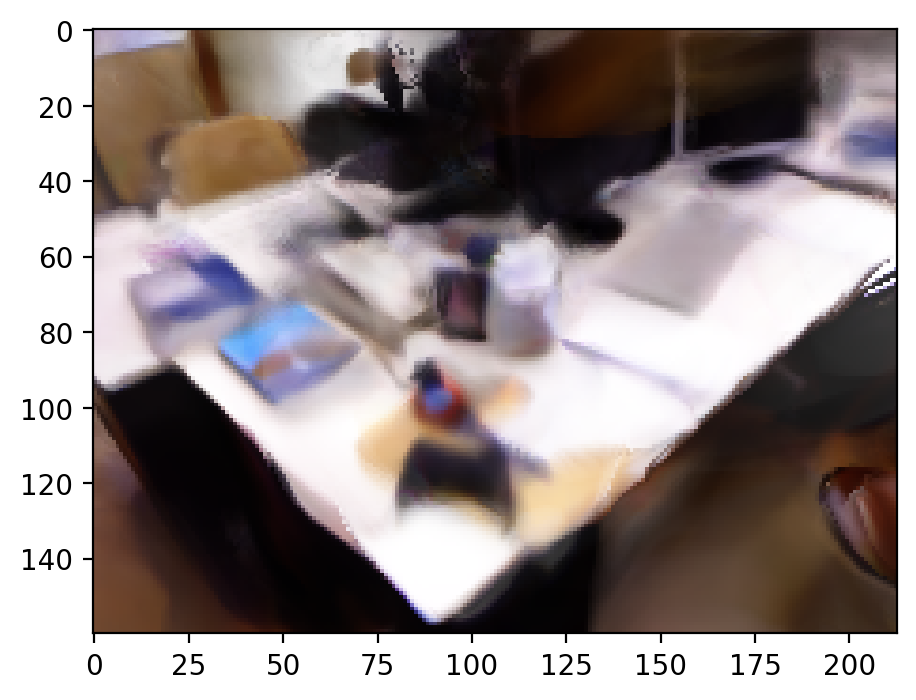

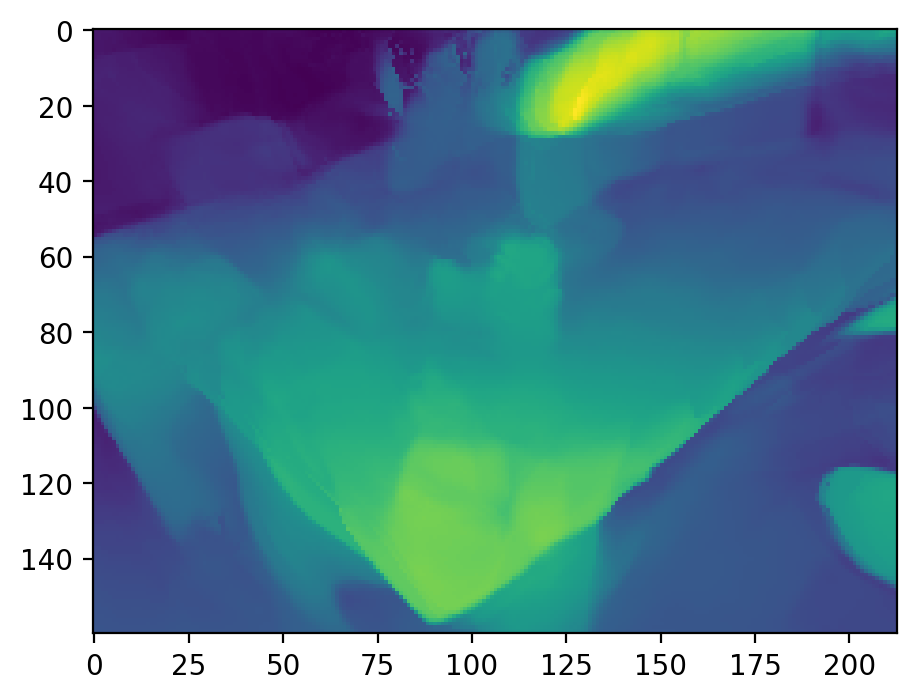

In [107]:
batch_size = pixels.shape[0]
batch_count = pixels.shape[0] // batch_size
output_course_color = []
output_course_depth = []
output_fine_color = []
output_fine_depth = []
model = model.cuda()
model.eval()
with torch.no_grad():
    for i in tqdm(range(batch_count)):
        output = model(pixels[i * batch_size:i * batch_size + batch_size],
                             positions[i * batch_size:i * batch_size + batch_size])
        output_course_color.append(output[0])
        output_course_depth.append(output[1])
        output_fine_color.append(output[2])
        output_fine_depth.append(output[3])

reconstructed_image = torch.cat(output_fine_color, dim=0).reshape(480 // scale, 640 // scale, 3).detach().cpu().numpy()
mean = data_module.camera_info()._color_mean
std = data_module.camera_info()._color_std
reconstructed_image = reconstructed_image * std[None, None] + mean[None, None]
reconstructed_image = np.clip(reconstructed_image / 255., 0, 1)
figure = plt.figure(dpi=200)
plt.imshow(cv2.cvtColor(reconstructed_image.astype(np.float32), cv2.COLOR_RGB2BGR))

reconstructed_depth = torch.cat(output_fine_depth, dim=0).reshape(480 // scale, 640 // scale).detach().cpu().numpy()
figure = plt.figure(dpi=200)
plt.imshow(1. /reconstructed_depth)

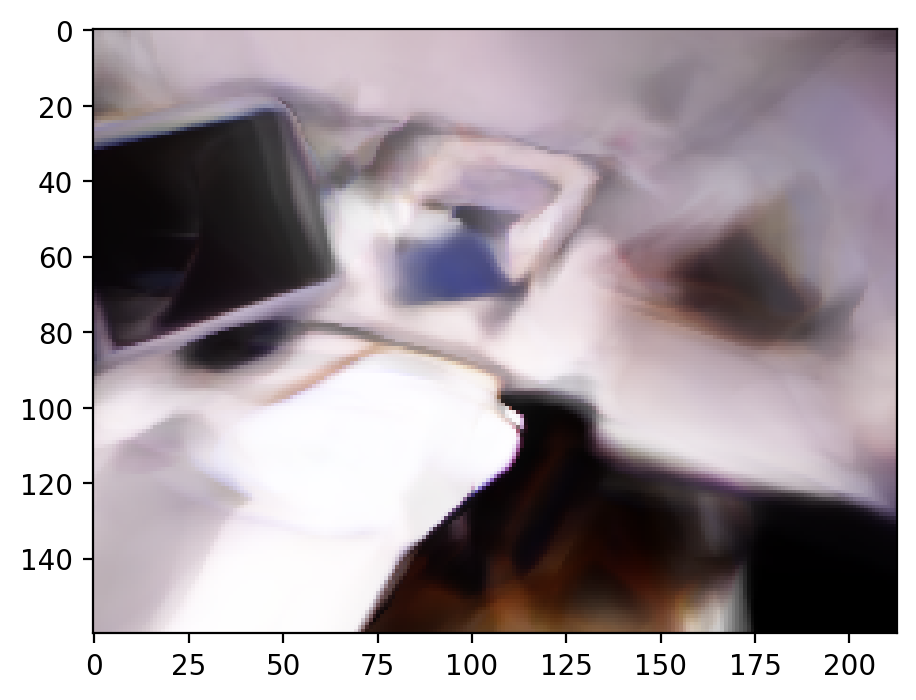

In [92]:
reconstructed_image = torch.cat(output_course_color, dim=0).reshape(480 // scale, 640 // scale, 3).detach().cpu().numpy()
mean = data_module.camera_info()._color_mean
std = data_module.camera_info()._color_std
reconstructed_image = reconstructed_image * std[None, None] + mean[None, None]
reconstructed_image = np.clip(reconstructed_image / 255., 0, 1)
figure = plt.figure(dpi=200)
plt.imshow(cv2.cvtColor(reconstructed_image.astype(np.float32), cv2.COLOR_RGB2BGR))

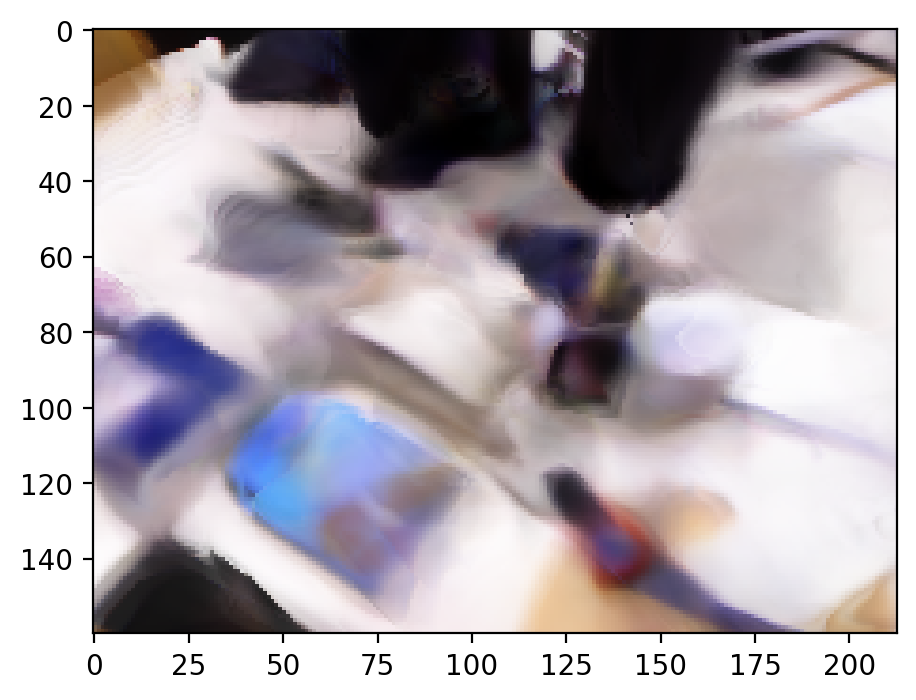

In [88]:
reconstructed_image = torch.cat(output_fine_color, dim=0).reshape(480 // scale, 640 // scale, 3).detach().cpu().numpy()
mean = data_module.camera_info()._color_mean
std = data_module.camera_info()._color_std
reconstructed_image = reconstructed_image * std[None, None] + mean[None, None]
reconstructed_image = np.clip(reconstructed_image / 255., 0, 1)
figure = plt.figure(dpi=200)
plt.imshow(cv2.cvtColor(reconstructed_image.astype(np.float32), cv2.COLOR_RGB2BGR))

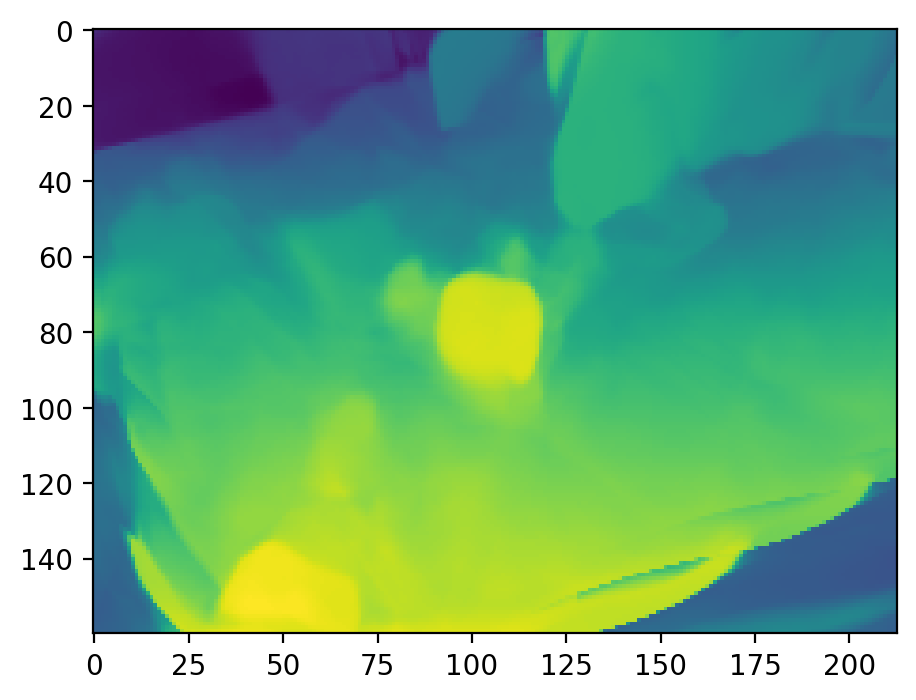

In [79]:
reconstructed_depth = torch.cat(output_course_depth, dim=0).reshape(480 // scale, 640 // scale).detach().cpu().numpy()
figure = plt.figure(dpi=200)
plt.imshow(1. /reconstructed_depth)

Epoch 1:  88%|████████▊ | 331/375 [51:43<06:52,  9.38s/it, loss=0.384, v_num=5]


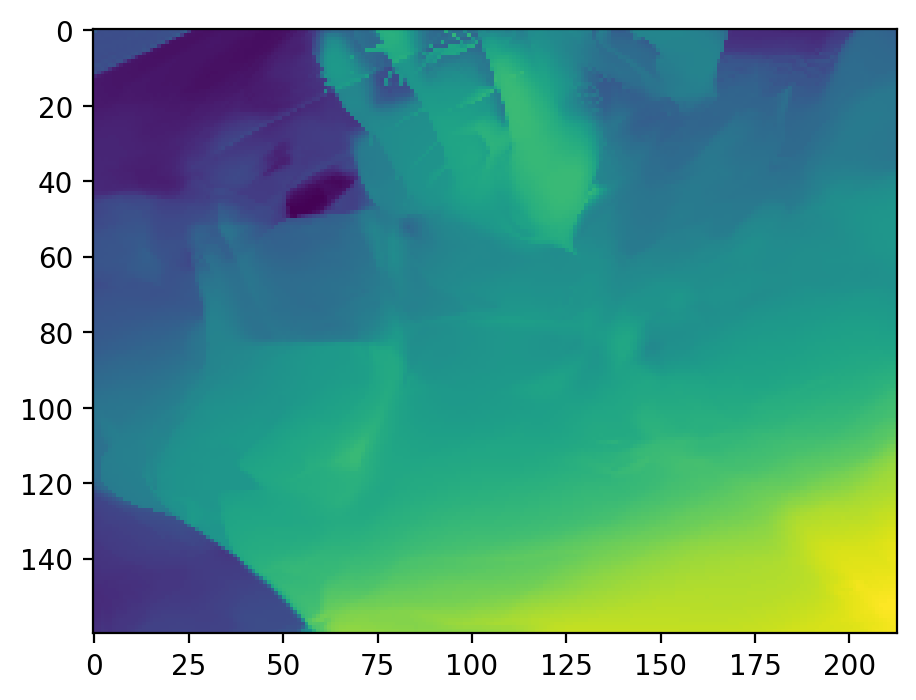

In [102]:
reconstructed_depth = torch.cat(output_fine_depth, dim=0).reshape(480 // scale, 640 // scale).detach().cpu().numpy()
figure = plt.figure(dpi=200)
plt.imshow(1. /reconstructed_depth)

# Test depth sampling

In [32]:
batch = None
for x in data_module.train_dataloader():
    batch = x
    break

In [33]:
batch

{'pixel': tensor([[502., 159.],
         [359., 274.],
         [578., 160.],
         ...,
         [604., 288.],
         [195., 408.],
         [ 32.,  66.]]),
 'color': tensor([[0.8242, 0.7734, 0.8242],
         [0.9023, 0.9570, 0.9922],
         [0.0234, 0.0117, 0.0156],
         ...,
         [0.5547, 0.5703, 0.6406],
         [0.9844, 0.9766, 0.9805],
         [0.6367, 0.6094, 0.6758]]),
 'depth': tensor([0.1775, 0.1292, 0.0000,  ..., 0.0000, 0.1139, 0.3527]),
 'camera_position': tensor([[[ 0.4879,  0.4318, -0.7586,  0.1705],
          [ 0.8725, -0.2686,  0.4083, -0.0167],
          [-0.0274, -0.8611, -0.5078,  0.1448],
          [ 0.0000,  0.0000,  0.0000,  1.0000]],
 
         [[ 0.4879,  0.4318, -0.7586,  0.1705],
          [ 0.8725, -0.2686,  0.4083, -0.0167],
          [-0.0274, -0.8611, -0.5078,  0.1448],
          [ 0.0000,  0.0000,  0.0000,  1.0000]],
 
         [[ 0.9914,  0.1184,  0.0552,  0.0231],
          [ 0.0323, -0.6314,  0.7748, -0.0324],
          [ 0.1266, -0.

In [34]:
image_index = 0
y = 304
x = 300
dataset_index = image_index * 480 * 640 + y * 640 + x
element = data_module._dataset[dataset_index]
pixel = torch.tensor(element['pixel']).cuda()[None]
camera_position = torch.tensor(element['camera_position']).cuda()[None]
truth_depth = torch.tensor(element['depth']).cuda()[None]

In [35]:
# pixel = batch['pixel'].cuda()
# camera_position = batch['camera_position'].cuda()
# truth_depth = batch['depth'].cuda()
course_sampled_depths = model.stratified_sample_depths(
    pixel.shape[0],
    pixel.device,
    model.hparams.course_sample_bins,
    False)
model = model.cuda()

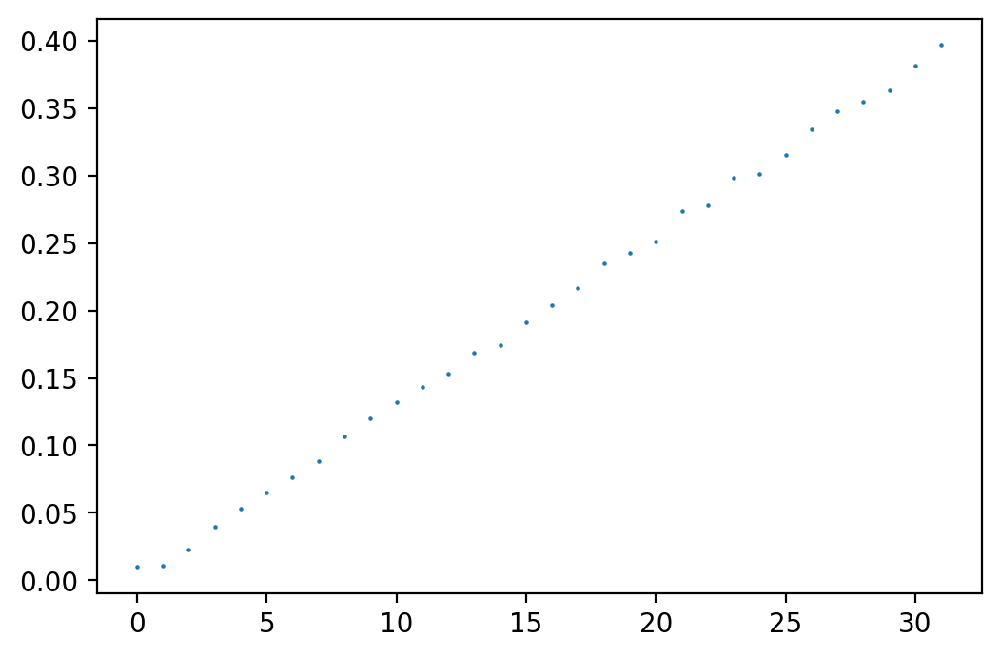

In [36]:
plt.figure(dpi=200)
plotted_depths = course_sampled_depths[:, 0].detach().cpu().numpy()
plt.scatter(np.arange(plotted_depths.shape[0]), plotted_depths, s=0.4)

In [37]:
course_color, course_depths, course_weights, course_depth_variance = model.reconstruct_color_and_depths(
    course_sampled_depths,
    pixel,
    camera_position,
    model._mlp)

In [38]:
bins_count = course_sampled_depths.shape[0]
sampled_depths = torch.sort(course_sampled_depths, dim=0).values
sampled_depths = course_sampled_depths.reshape(-1)
pixels1 = model.repeat_tensor(pixel, bins_count)
camera_positions1 = model.repeat_tensor(camera_position, bins_count)
back_projected_points = back_project_pixel(pixels1, sampled_depths, camera_positions1,
                                           model._inverted_camera_matrix)
encodings = model._positional_encoding(back_projected_points)
prediction = model._mlp(encodings)

colors = prediction[:, :3].reshape(bins_count, -1, 3)
density = prediction[:, 3].reshape(bins_count, -1)

logsumexp_density = torch.logsumexp(torch.cat([torch.zeros_like(density)[None], density[None]], dim=0), dim=0)

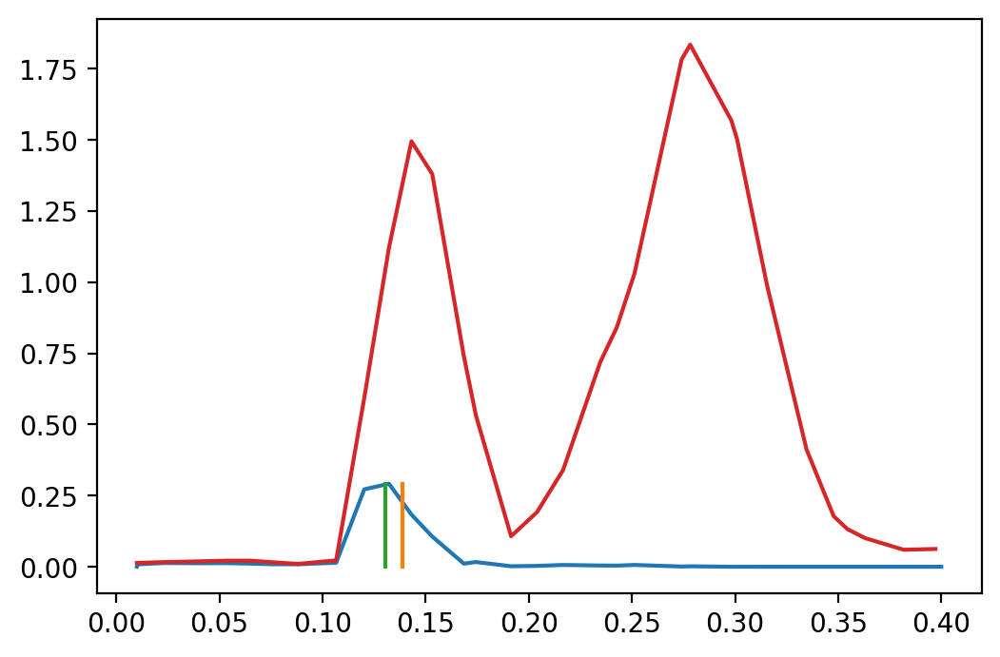

In [39]:
plt.figure(dpi=200)
index = 0
plotted_depths = course_sampled_depths[:, index].detach().cpu().numpy()
plotted_depths = np.append(plotted_depths, 0.4)
plotted_weigths = course_weights[:, index].detach().cpu().numpy()
plotted_truth_depth = truth_depth[index].detach().cpu().numpy()
plotted_density = logsumexp_density[:, index].detach().cpu().numpy()
mean_depth = np.sum(plotted_depths * plotted_weigths)
plt.plot(plotted_depths, plotted_weigths)
plt.plot([plotted_truth_depth, plotted_truth_depth], [0, np.max(plotted_weigths)])
plt.plot([mean_depth, mean_depth], [0, np.max(plotted_weigths)])
plt.plot(plotted_depths[:-1], plotted_density / 50.)

In [30]:
fine_sampled_depths = model.hierarchical_sample_depths(
    course_weights,
    pixel.shape[0],
    pixel.device,
    50,
    course_sampled_depths,
    False)

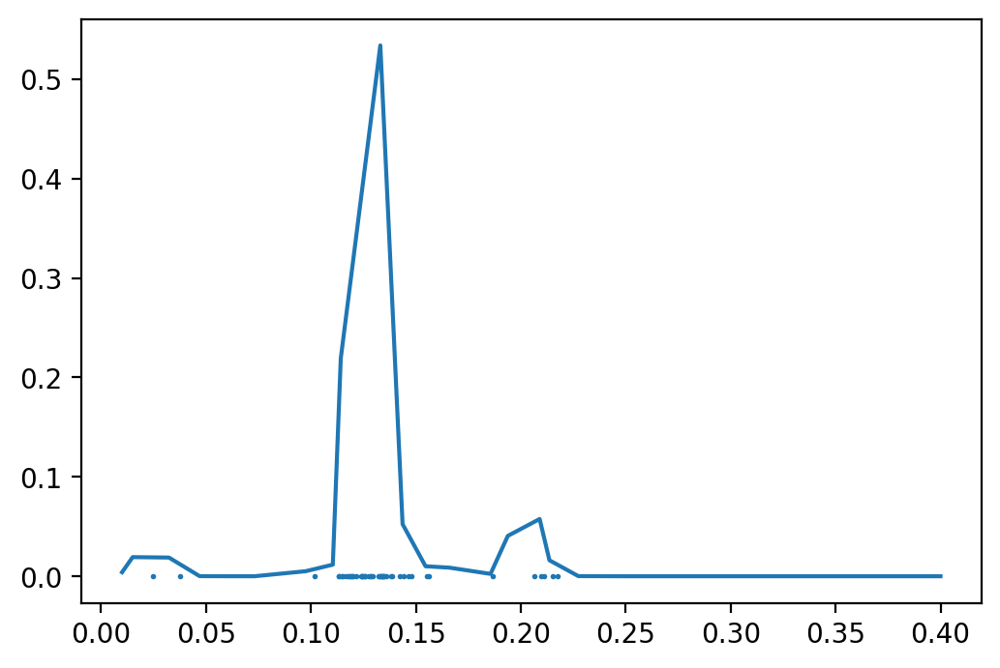

In [31]:
plt.figure(dpi=200)
index = 0
plotted_course_depths = course_sampled_depths[:, index].detach().cpu().numpy()
plotted_course_depths = np.append(plotted_course_depths, 0.4)
plotted_fine_depths = fine_sampled_depths[:, index].detach().cpu().numpy()
plotted_weigths = course_weights[:, index].detach().cpu().numpy()
plt.plot(plotted_course_depths, plotted_weigths)
plt.scatter(plotted_fine_depths, np.zeros_like(plotted_fine_depths), s=1)

In [32]:
with torch.no_grad():
    fine_color, fine_depths, fine_weights, fine_depth_variance = model.reconstruct_color_and_depths(
        fine_sampled_depths,
        pixel,
        camera_position,
        model._mlp)

In [33]:
bins_count = fine_sampled_depths.shape[0]
sampled_depths = torch.sort(fine_sampled_depths, dim=0).values
sampled_depths = fine_sampled_depths.reshape(-1)
pixels1 = model.repeat_tensor(pixel, bins_count)
camera_positions1 = model.repeat_tensor(camera_position, bins_count)
back_projected_points = back_project_pixel(pixels1, sampled_depths, camera_positions1,
                                           model._inverted_camera_matrix)
encodings = model._positional_encoding(back_projected_points)
prediction = model._mlp(encodings)

colors = prediction[:, :3].reshape(bins_count, -1, 3)
density = prediction[:, 3].reshape(bins_count, -1)

fine_logsumexp_density = torch.logsumexp(torch.cat([torch.zeros_like(density)[None], density[None]], dim=0), dim=0)

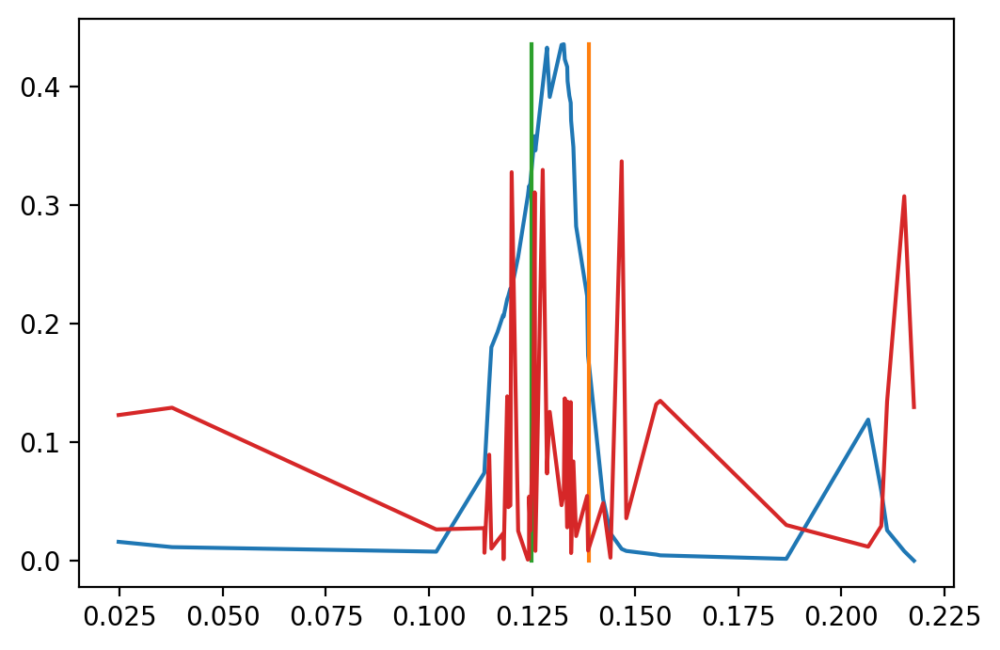

In [34]:
plt.figure(dpi=200)
index = 0
plotted_depths = torch.sort(fine_sampled_depths[:, index], dim=0).values.detach().cpu().numpy()
depth_deltas =  np.roll(plotted_depths, -1) - plotted_depths
plotted_weigths = fine_weights[:, index].detach().cpu().numpy()[:-1]
plotted_truth_depth = truth_depth[index].detach().cpu().numpy()
mean_depth = np.sum(plotted_depths * plotted_weigths)

plt.plot(plotted_depths, plotted_weigths / depth_deltas / 100)

plt.plot([plotted_truth_depth, plotted_truth_depth], [0, np.max(plotted_weigths / depth_deltas / 100)])
plt.plot([mean_depth, mean_depth], [0, np.max(plotted_weigths / depth_deltas / 100)])

plotted_density = fine_logsumexp_density[:, index].detach().cpu().numpy()
plt.plot(plotted_depths, plotted_density / 1000)